In [1]:
%load_ext autoreload
%autoreload 2

# init and load image - visium tutorial

In [1]:
import os
import numpy as np 
from bokeh.plotting import show, output_notebook
import pandas as pd
import socket
import tissue_tag as tt
import matplotlib.pyplot as plt
import scanpy as sc
output_notebook()
host = '5010'

Loading BokehJS ...

# Load image and define annotation names and colors 

<Figure size 1200x1200 with 0 Axes>

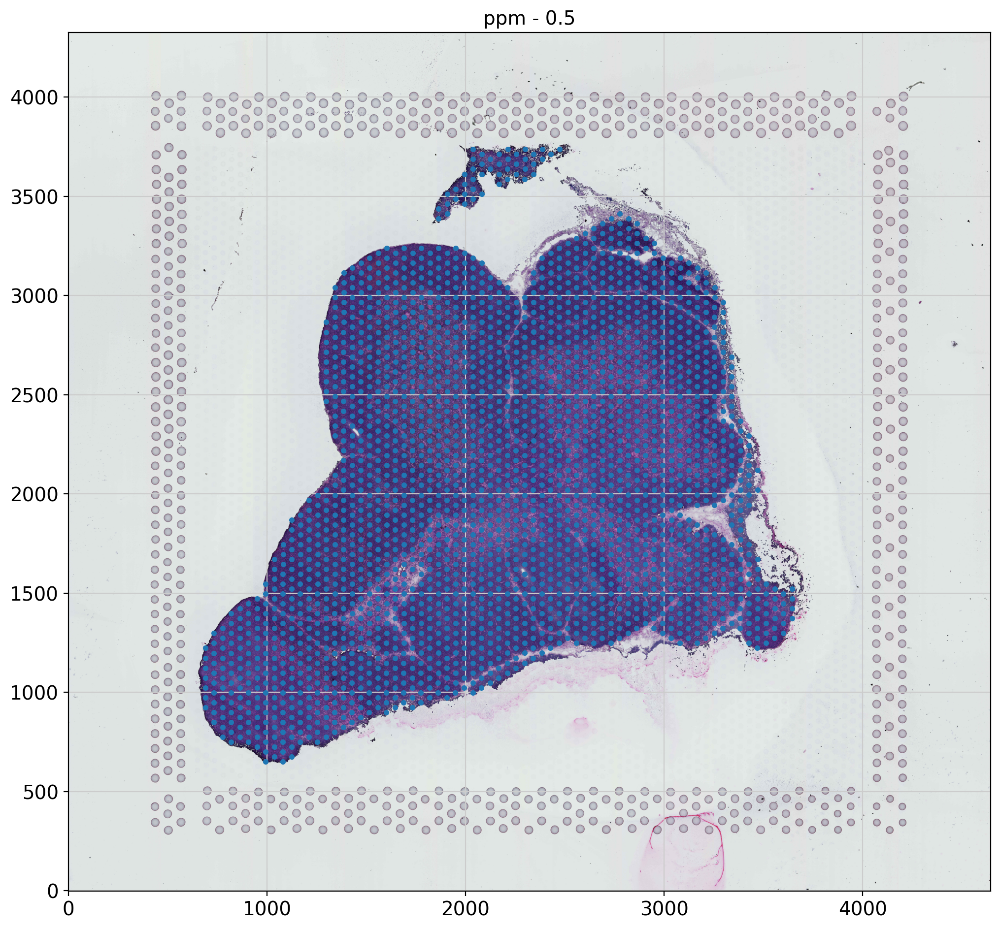

In [116]:
plt.figure(figsize=[12,12])
vis_path = '/nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_THYst9518030/'
im,ppm,df = tt.read_visium(spaceranger_dir_path=vis_path,use_resolution='hires5K',res_in_ppm=0.5,header=None)

# Correct annotations Lv_0

In [3]:
# generate new annotation 
# result = np.zeros(im.shape[:2], dtype=np.uint8)+1


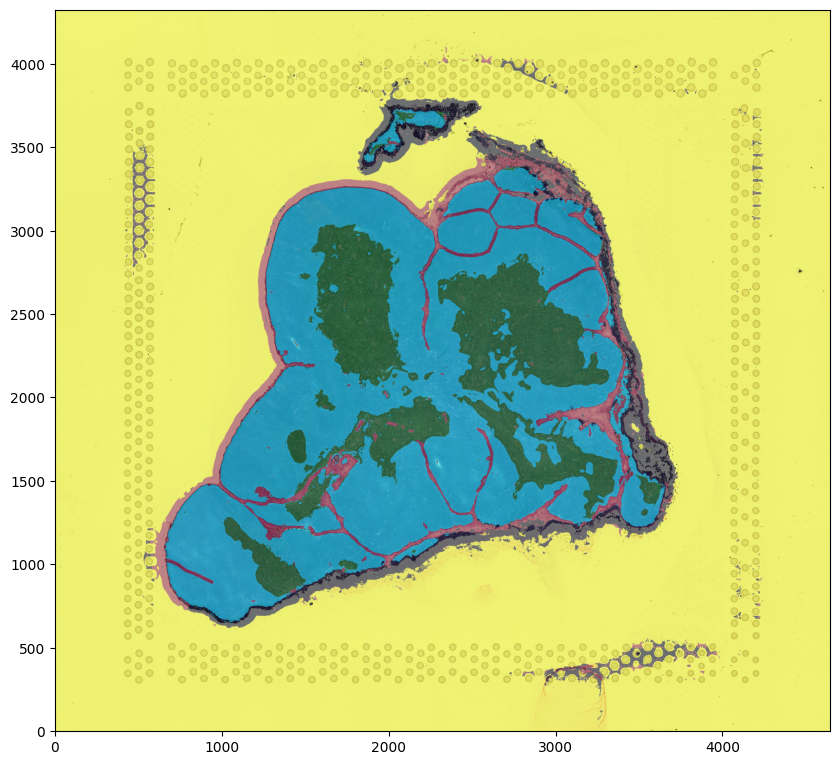

In [3]:
# read lv 0 
# define annotations Lv0 
annodict = {
    'unassigned':'yellow',
    'Cortex':'cyan',
    'Medulla':'green',
    'Edge':'brown',
    'Artifacts':'black',
    # 'lymph':'red',
}



import cv2
from PIL import Image
result = np.array(Image.open(vis_path+'/tissue_annotations/Annotation_lv_0.tif'))
# result = np.array(Image.open(vis_path+'/tissue_annotations/annotations_level_0.tif'))


result = cv2.resize(result, (im.shape[1], im.shape[0]), interpolation = cv2.INTER_NEAREST)
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_labels(im,result_rgb,alpha=0.5)

## Manually draw annotations or Correct old annotations

In [20]:
# at this stage, if you are adding annotations make sure they come after the current ones otherwise it will mess up everything
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_labels(im,result_rgb,alpha=0.6,show=False)
tabs,render_dict = tt.annotator(im,out_img,anno_dict=annodict)
# plotting
def app(doc):
    global tabs
    doc.add_root(tabs)
show(app,notebook_url=f'{socket.gethostname()}:'+host)
print('wait for it.. can take a few tens of seconds on farm... (double time of the former plot)')

wait for it.. can take a few tens of seconds on farm... (double time of the former plot)


## update annotations 

unassigned
Cortex
Edge


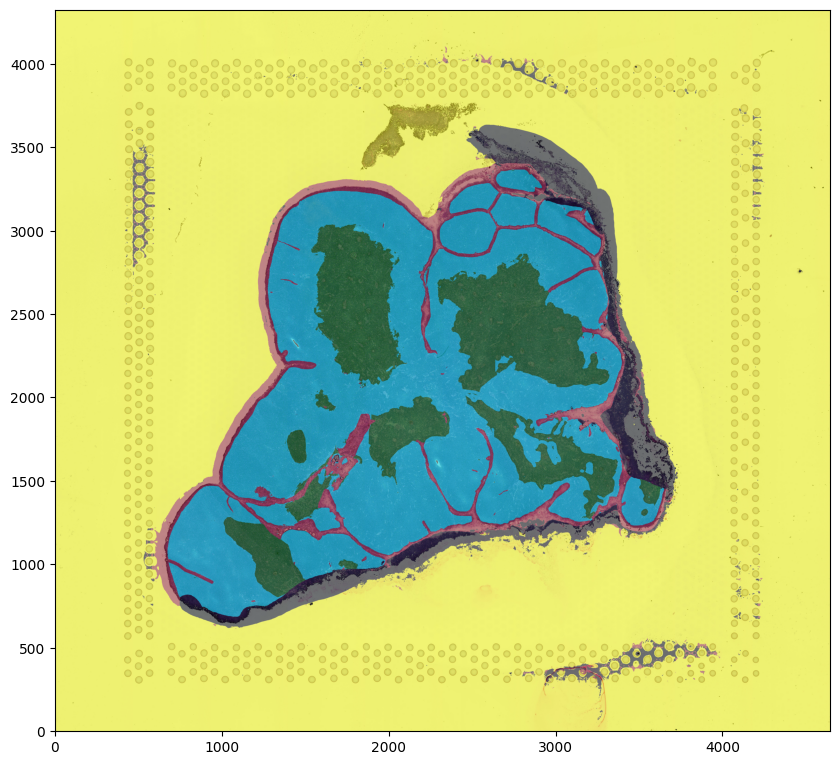

In [21]:
out_img, result = tt.update_annotator(im,result,anno_dict=annodict,render_dict=render_dict,alpha=0.5)
# plot result 
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_labels(im,result_rgb,alpha=0.5)

## save annotation 

In [22]:
isExist = os.path.exists(vis_path+'tissue_annotations')
if not(isExist):
    os.mkdir(vis_path+'/tissue_annotations/')
    
tt.save_annotation(
    folder=vis_path+'/tissue_annotations/',
    label_image=result,
    file_name='annotations_level_0',
    anno_names=list(annodict.keys()),
    anno_colors=list(annodict.values()),
    ppm = ppm
)

# Correct annotations Lv_1

In [97]:
# generate new annotation 
# result = np.zeros(im.shape[:2], dtype=np.uint8)+1


array([1, 2, 3], dtype=uint8)

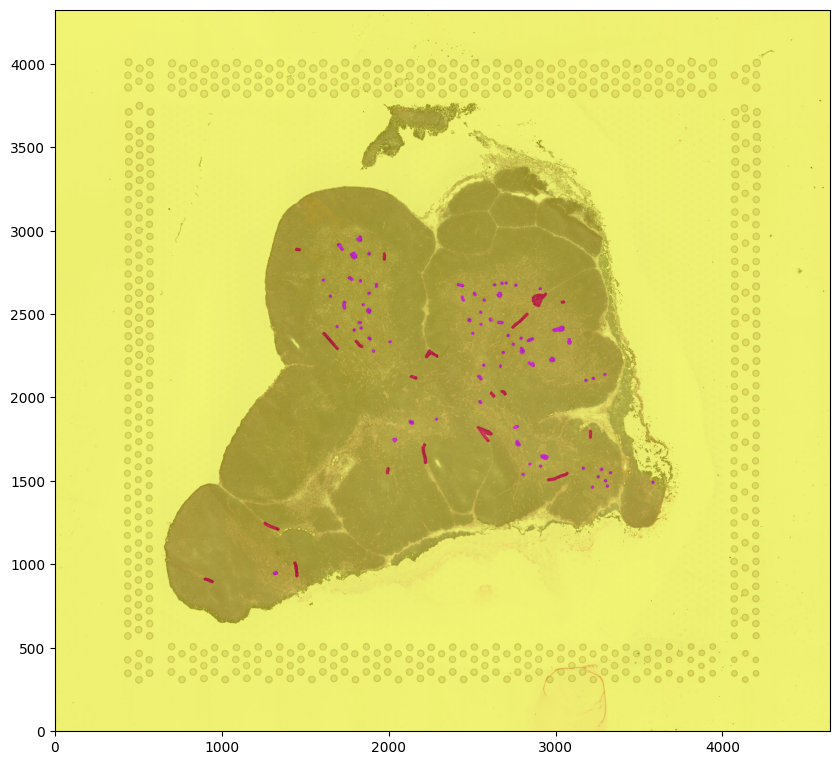

In [23]:
# read lv 1
# define annotations Lv1
annodict = {
    'unassigned':'yellow',
    'PVS':'red',
    'HS':'magenta',
    'fat':'black',
    # 'vessels':'blue',
}

# optional if not going for step 2 bypass classifier 
# result = np.ones(im.shape[:2], dtype=np.uint8)+1

import cv2
from PIL import Image
result = np.array(Image.open(vis_path+'/tissue_annotations/Annotation_lv_1.tif'))
result = result + np.zeros(result.shape[:2], dtype=np.uint8)+1
result[np.where(result==4)] = 1 # correct gap in aanotation 
result = cv2.resize(result, (im.shape[1], im.shape[0]), interpolation = cv2.INTER_NEAREST)
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_labels(im,result_rgb,alpha=0.5)
np.unique(result)

## Manually draw annotations or Correct old annotations

In [25]:
# at this stage, if you are adding annotations make sure they come after the current ones otherwise it will mess up everything
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_labels(im,result_rgb,alpha=0.5,show=False)
tabs,render_dict = tt.annotator(im,out_img,anno_dict=annodict)
# plotting
def app(doc):
    global tabs
    doc.add_root(tabs)
show(app,notebook_url=f'{socket.gethostname()}:'+host)
print('wait for it.. can take a few tens of seconds on farm... (double time of the former plot)')

wait for it.. can take a few tens of seconds on farm... (double time of the former plot)


## update annotations 

PVS


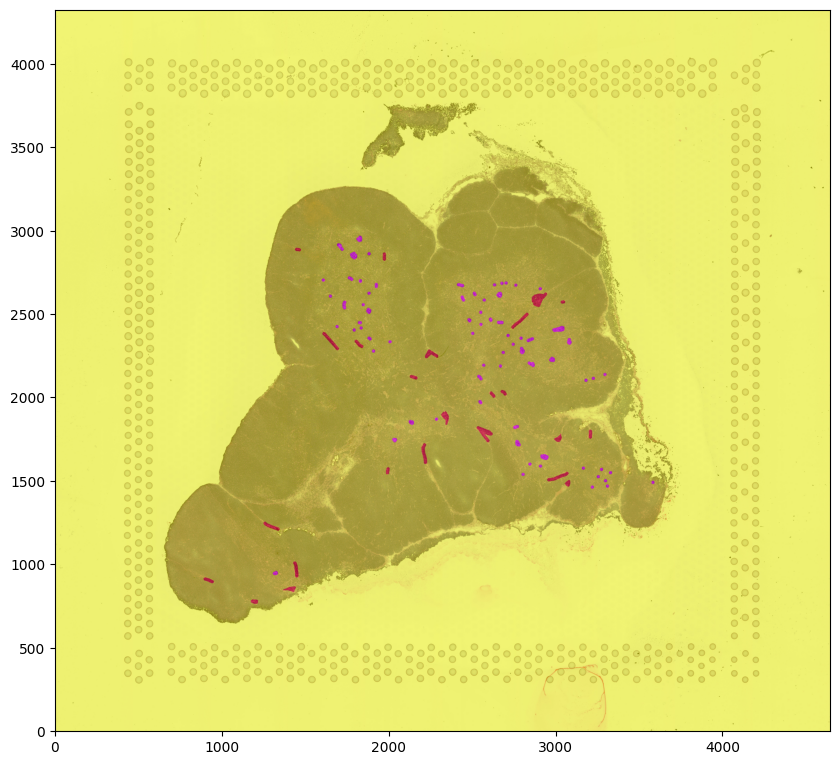

In [26]:
out_img, result = tt.update_annotator(im,result,anno_dict=annodict,render_dict=render_dict,alpha=0.5)
# plot result 
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_labels(im,result_rgb,alpha=0.5)

## save annotation 

In [27]:
isExist = os.path.exists(vis_path+'tissue_annotations')
if not(isExist):
    os.mkdir(vis_path+'/tissue_annotations/')
    
tt.save_annotation(
    folder=vis_path+'/tissue_annotations/',
    label_image=result,
    file_name='annotations_level_1',
    anno_names=list(annodict.keys()),
    anno_colors=list(annodict.values()),
    ppm = ppm
)

# generate lobule annotations

In [104]:
# define annotations Lv0 
annodict = {
    'lobes':'green'
}
# at this stage, if you are adding annotations make sure they come after the current ones otherwise it will mess up everything
result = np.zeros((im.shape[0],im.shape[1]), dtype=np.uint8) # blank annotation image

result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_labels(im,result_rgb,alpha=0.5,show=False)
tabs,render_dict = tt.poly_annotator(im,out_img,anno_dict=annodict)

# plotting
def app(doc):
    global tabs
    doc.add_root(tabs)
show(app,notebook_url=f'{socket.gethostname()}:'+host)
print('this takes up to a 20 sec on farm')

this takes up to a 20 sec on farm


lobes
{'unassigned': 'yellow', 'lobes_0': 'cyan', 'lobes_1': 'cyan', 'lobes_2': 'orange', 'lobes_3': 'brown', 'lobes_4': 'cyan', 'lobes_5': 'magenta', 'lobes_6': 'cyan'}


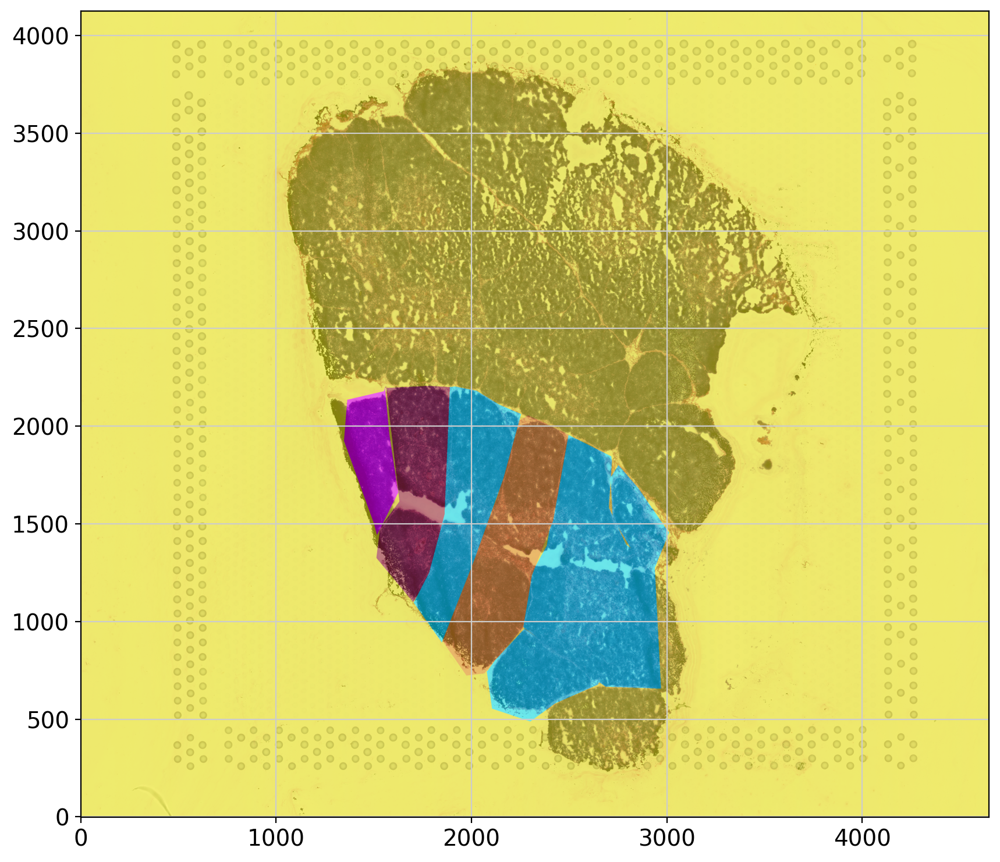

In [105]:
result,object_dict  = tt.object_annotator(im,result,anno_dict=annodict,render_dict=render_dict,alpha=0.5)
print(object_dict)
# plot result 
result_rgb = tt.rgb_from_labels(result,colors=list(object_dict.values()))
out_img = tt.overlay_labels(im,result_rgb,alpha=0.5)
plt.show()

# Read old lobule annotations

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19], dtype=int32)

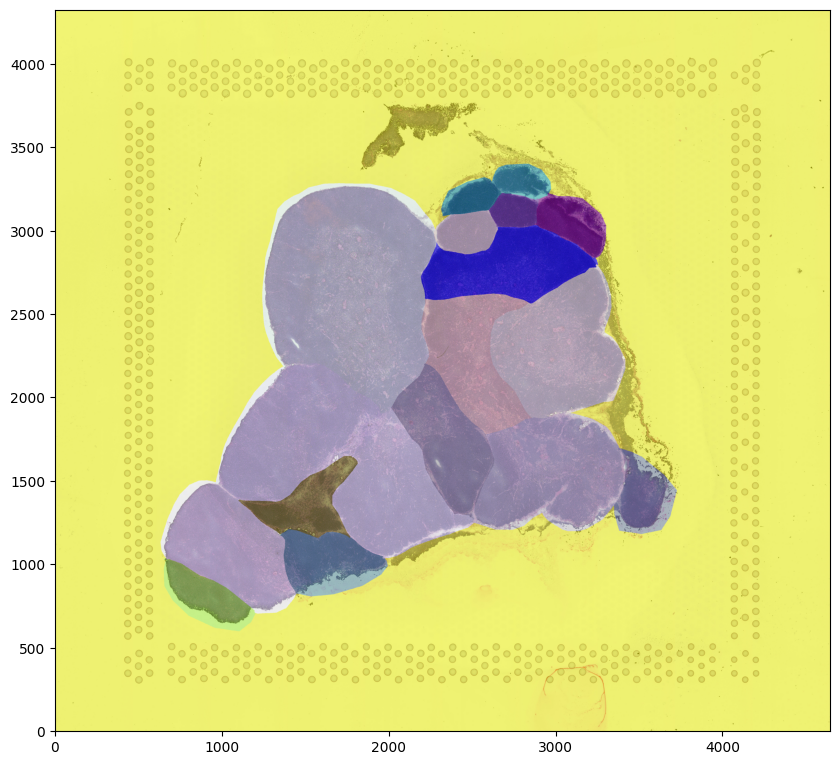

In [30]:
import cv2
from PIL import Image
import random
import matplotlib.colors as mcolors

# result = np.array(Image.open(vis_path+'/tissue_annotations/Annotation_lobules.tif'))
result = np.array(Image.open(vis_path+'/tissue_annotations/Annotation_lobules_1.tif'))

np.unique(result)
# define annotations Lv0 
colorpool = list(mcolors.CSS4_COLORS.keys())
# result = result + np.zeros(result.shape[:2], dtype=np.uint8)+1

# get unique values in the array
unique_values = np.unique(result)

# Create bins that start from each unique value minus 0.5, so that np.digitize will find the right indices
bins = unique_values - 0.5

# use np.digitize to get the new values
result = np.digitize(result, bins, right=True)

base_name = 'lobule'
annodict = {'unassigned': 'yellow'}
for l in np.unique(result):
    annodict[base_name+'_'+str(l)] = random.choice(colorpool)

result = cv2.resize(result, (im.shape[1], im.shape[0]), interpolation = cv2.INTER_NEAREST)
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_labels(im,result_rgb,alpha=0.5)

np.unique(result)

## save annotation 

In [31]:
isExist = os.path.exists(vis_path+'tissue_annotations')
if not(isExist):
    os.mkdir(vis_path+'/tissue_annotations/')
    
tt.save_annotation(
    folder=vis_path+'/tissue_annotations/',
    label_image=result,
    file_name='annotations_lobules_1',
    anno_names=list(annodict.keys()),
    anno_colors=list(annodict.values()),
    ppm = ppm
)

# Move annotations to anndata

In [ ]:
spot_diameter = 15 # in microns
df, ppm_grid = tt.load_and_combine_annotations(
    folder=vis_path+'/tissue_annotations/',
    file_names=['annotations_level_0', 'annotations_level_1', 'annotations_lobules_0'],
    spot_diameter=spot_diameter
)

loaded annotation image - annotations_level_0 size - (4325, 4644)
loaded annotations
{1: 'unassigned', 2: 'Cortex', 3: 'Medulla', 4: 'Edge', 5: 'Artifacts'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'Cortex': 'cyan', 'Medulla': 'green', 'Edge': 'brown', 'Artifacts': 'black'}
generating grid with spot size - 15, with resolution of - 0.5 ppm
annotations_level_0


208461it [00:33, 6021.03it/s]

In [ ]:
# remove background spots if you are not interested in it!
df = df.iloc[np.where(df['annotations_level_0']!='unassigned')[0],:]
df = df.iloc[np.where(df['annotations_level_0']!='Artifacts')[0],:]
df

## move annotation and distances to visium spots 

In [ ]:
adata_vis = tt.map_annotations_to_visium(vis_path=vis_path, df_grid=df, ppm_grid=ppm_grid, spot_diameter=spot_diameter)
adata_vis

In [ ]:
tt.annotate_l2(adata_vis, annotation='annotations_level_0', KNN=10, max_distance_factor=50, plot=False)
tt.annotate_l2(adata_vis, annotation='annotations_level_1', KNN=1, max_distance_factor=50, plot=False)

In [ ]:
import scanpy as sc
sc.set_figure_params(figsize=[10,10],dpi=50)
sc.pl.spatial(adata_vis,color=adata_vis.obs.columns,ncols=4,wspace=0.25)

# axis part

In [ ]:
# axis calculations on visium 
df = adata_vis.obs
df['cm'] = (df['L2_dist_annotations_level_0_Cortex'] - df['L2_dist_annotations_level_0_Medulla'])/(df['L2_dist_annotations_level_0_Cortex'] + df['L2_dist_annotations_level_0_Medulla'])
df['cc'] = (df['L2_dist_annotations_level_0_Edge'] - df['L2_dist_annotations_level_0_Cortex'])/(df['L2_dist_annotations_level_0_Cortex'] + df['L2_dist_annotations_level_0_Edge'])
df['cma_v2'] = 0.2*df['cc'] + 0.8*df['cm']

path_to_visiumator = '/nfs/team205/ny1/ThymusSpatialAtlas/ImageSpot/'
os.chdir(path_to_visiumator)
import visiumator as vm
import seaborn as sns
ct_order = ['Capsular','Sub-Capsular','Cortical level I','Cortical level II','Cortical level III','Cortical CMJ','Medullar CMJ','Medullar level I','Medullar level II','Medullar level III','Medullar Deep']
ct_color_map = dict(zip(ct_order, np.array(sns.color_palette("tab20", len(ct_order)))[range(len(ct_order))]))
ct2_values = [-0.7,-0.6,-0.55,-0.4,-0.3,0.1,0.55,0.65,0.7,0.74]
df = vm.bin_axis(ct_order ,ct2_values,df,'cma_v2')   
adata_vis.obs.loc[df['annotations_level_0']=='Edge','manual_bin_cma_v2'] = 'Capsular'
adata_vis.obs['manual_bin_cma_v2'].value_counts()
adata_vis.obs['cma_v2'].hist(bins=50)
plt.show()

# plotting visium space 
sc.set_figure_params(figsize=[10,10],dpi=100)
sc.pl.spatial(adata_vis,color=['manual_bin_cma_v2'],ncols=1,wspace=0.25)
sc.pl.spatial(adata_vis,color=['cma_v2'],cmap='gist_rainbow',ncols=1,wspace=0.25)

In [ ]:
# axis calculations on hiresgrid 
df = adata_vis.uns['hires_grid']
df['cm'] = (df['L2_dist_annotations_level_0_Cortex'] - df['L2_dist_annotations_level_0_Medulla'])/(df['L2_dist_annotations_level_0_Cortex'] + df['L2_dist_annotations_level_0_Medulla'])
df['cc'] = (df['L2_dist_annotations_level_0_Edge'] - df['L2_dist_annotations_level_0_Cortex'])/(df['L2_dist_annotations_level_0_Cortex'] + df['L2_dist_annotations_level_0_Edge'])
df['cma_v2'] = 0.2*df['cc'] + 0.8*df['cm']

path_to_visiumator = '/nfs/team205/ny1/ThymusSpatialAtlas/ImageSpot/'
os.chdir(path_to_visiumator)
import visiumator as vm
import seaborn as sns
df = vm.bin_axis(ct_order ,ct2_values,df,'cma_v2')   
df.loc[df['annotations_level_0']=='Edge','manual_bin_cma_v2'] = 'Capsular'
df['manual_bin_cma_v2'].value_counts()
df['cma_v2'].hist(bins=50)
plt.show()

os.chdir(vis_path)

# plotting 
plt.figure(dpi=100, figsize=[7,7])
plt.scatter(df['x'],df['y'],c=df['cma_v2'],cmap='gist_rainbow',s=0.1,marker='.')
plt.grid(False)
plt.title('cma_v2')
plt.colorbar(aspect=30,fraction=0.03)
plt.axis('equal')
for pos in ['right', 'top', 'bottom', 'left']:
    plt.gca().spines[pos].set_visible(False)
plt.savefig('cma_v2.png', dpi=300)  # saves the figure
plt.show()

plt.figure(dpi=100, figsize=[10,10])
sns.scatterplot(x=df['x'],y=df['y'],hue=df['manual_bin_cma_v2'],palette=ct_color_map,s=1,)
plt.grid(False)
plt.title('cma_bin_manual_v2')
plt.axis('equal')
plt.savefig('cma_bin_manual_v2.png', dpi=300)  # saves the figure

In [ ]:
adata_vis.write(vis_path+'adata_cma_v2.h5ad')

In [ ]:
vis_path